# Spatial Reasoning with Point Clouds


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install open3d pypotree --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 kB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 95.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 89.7 MB/s eta 0:00:00


In [ ]:
!pip install timm==0.6.7

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.0/510.0 kB 11.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
!git clone https://github.com/isl-org/ZoeDepth.git

Cloning into 'ZoeDepth'...
remote: Enumerating objects: 111, done.
remote: Counting objects: 100% (105/105), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 111 (delta 39), reused 63 (delta 24), pack-reused 6
Receiving objects: 100% (111/111), 4.09 MiB | 16.06 MiB/s, done.
Resolving deltas: 100% (39/39), done.


In [ ]:
import os
import cv2
import math
import torch
import pypotree
import numpy as np
import open3d as o3d
from matplotlib import pyplot as plt
from matplotlib import cm

## Zoedepth

In [ ]:
import torch
from ZoeDepth.zoedepth.utils.misc import get_image_from_url, colorize
from PIL import Image
import matplotlib.pyplot as plt


zoe = torch.hub.load("./ZoeDepth", "ZoeD_N", source="local", pretrained=True)

img_size [384, 512]


/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _V

Params passed to Resize transform:
	width:  512
	height:  384
	resize_target:  True
	keep_aspect_ratio:  True
	ensure_multiple_of:  32
	resize_method:  minimal
Using pretrained resource url::https://github.com/isl-org/ZoeDepth/releases/download/v1.0/ZoeD_M12_N.pt


Downloading: "https://github.com/isl-org/ZoeDepth/releases/download/v1.0/ZoeD_M12_N.pt" to /root/.cache/torch/hub/checkpoints/ZoeD_M12_N.pt
100%|██████████| 1.34G/1.34G [00:12<00:00, 116MB/s]


Loaded successfully


In [ ]:
import warnings
warnings.filterwarnings("ignore")


In [ ]:

# img_url = "http://static1.squarespace.com/static/6213c340453c3f502425776e/62f2452bc121595f4d87c713/62f3c63c5eec2b12a333f851/1661442296756/Screenshot+2022-08-10+at+15.55.27.png?format=1500w" #@param {type:"string"}
# img = get_image_from_url(img_url)
image = Image.open("/content/drive/MyDrive/CAM_FRONT/Cars.jpg")
depth = zoe.infer_pil(image, output_type='pil')


# colored_depth = colorize(depth)
# fig, axs = plt.subplots(1,2, figsize=(15,7))
# for ax, im, title in zip(axs, [img, colored_depth], ['Input', 'Predicted Depth']):
#   ax.imshow(im)
#   ax.axis('off')
#   ax.set_title(title)

In [ ]:
depth.save('Cars_depth.png')

## Starting from a single RGB image


In [ ]:
rgb_path = "/content/drive/MyDrive/CAM_FRONT/Cars.jpg"
depth_path = "Cars_depth.png"
img = cv2.imread(rgb_path)
height, width, _ = img.shape

In [ ]:
import torch
# from PIL import Image
import cv2
import numpy as np

# Load the YOLO model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Load an image with PIL
# image = Image.open('Cars.jpg')

# Inference
results = model(image)

# Results
results.print()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 81.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 178.0 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 8.2s, installed 2 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 305MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1: 900x1600 2 persons, 3 cars, 4 traffic lights
Speed: 15.8ms pre-process, 67.3ms inference, 630.7ms NMS per image at shape (1, 3, 384, 640)


In [ ]:
%matplotlib inline

In [ ]:
def get_dominant_color(image, coordinates):
    # Crop the image to the bounding box
    x, y, w, h = coordinates
    crop_img = image[y:y+h, x:x+w]

    # Convert the cropped image to RGB (OpenCV uses BGR by default)
    crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)

    # Reshape the image to be a list of pixels
    pixels = crop_img.reshape((crop_img.shape[0] * crop_img.shape[1], 3))

    # Use k-means clustering to find the most dominant color
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=1)
    kmeans.fit(pixels)

    # The dominant color is the centroid of the cluster
    dominant_color = kmeans.cluster_centers_[0]
    return tuple(dominant_color.astype(int))

# Convert PIL image to OpenCV format
# img_cv = np.array(img)
# img_cv = img_cv[:, :, ::-1].copy()

# Loop through the detections and get the dominant color for each
for *xyxy, conf, cls in results.xyxy[0]:
    # Extract bounding box coordinates
    x1, y1, x2, y2 = map(int, xyxy)
    color = get_dominant_color(img, (x1, y1, x2-x1, y2-y1))
    print(f'Dominant color: {color}')


Dominant color: (83, 83, 83)
Dominant color: (88, 77, 76)
Dominant color: (88, 87, 86)
Dominant color: (94, 94, 94)
Dominant color: (78, 76, 74)
Dominant color: (90, 83, 81)
Dominant color: (90, 89, 89)
Dominant color: (136, 125, 125)
Dominant color: (97, 83, 78)


In [ ]:
# Define a function to get color name (simplified)
def color_name(hsv_color):
    hue, sat, val = hsv_color
    # Check for very low saturation first, which usually indicates grayscale.
    if sat < 20:  # You might need to adjust this threshold.
        if val > 70:
            return 'white'
        elif val < 30:
            return 'black'
        else:
            return 'gray'

    # For more saturated colors, use broader ranges.
    if 0 <= hue <= 15 or 160 <= hue <= 180:
        return 'red'
    elif 20 <= hue <= 45:
        return 'orange'
    elif 46 <= hue <= 70:
        return 'yellow'
    elif 71 <= hue <= 130:
        return 'green'
    elif 131 <= hue <= 170:
        return 'blue'
    elif 171 <= hue <= 179:
        return 'violet'
    # ... etc ...
    else:
        return 'unknown'


detected_objects = []

# Loop through the detections, get the color description, and print it along with the object class
for *xyxy, conf, cls in results.xyxy[0]:
    # Extract bounding box coordinates
    x1, y1, x2, y2 = map(int, xyxy)
    # Get the color
    rgb_color = get_dominant_color(img, (x1, y1, x2-x1, y2-y1))
    #print(f'RGB Color: {rgb_color}')
    color_desc = color_name(rgb_color)
    hsv_color = cv2.cvtColor(np.uint8([[rgb_color]]), cv2.COLOR_RGB2HSV)[0][0]
    #print(f'HSV Color: {hsv_color}')
    color_desc = color_name(hsv_color)
    class_name = results.names[int(cls)]
    if class_name != 'person':
      object_description = f'{color_desc} {class_name}'
      print(object_description)

      detected_objects.append(object_description)
print(detected_objects)


white car
red car
white car
red traffic light
white traffic light
red traffic light
red traffic light
['white car', 'red car', 'white car', 'red traffic light', 'white traffic light', 'red traffic light', 'red traffic light']


## Estimate Camera Parameters



In [ ]:
intrinsic_parameters = {
    'width': width,
    'height': height,
    'fx': 1.5 * width,
    'fy': 1.5 * width,
    'cx': width / 2,
    'cy': height / 2,
}

In [ ]:
def create_point_cloud_from_rgbd(rgb_image, depth_image, intrinsic_parameters):
    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
        o3d.io.read_image(rgb_image),
        o3d.io.read_image(depth_image),
        depth_scale=1000.0,
        depth_trunc=10.0,
        convert_rgb_to_intensity=False
    )
    intrinsic = o3d.camera.PinholeCameraIntrinsic()
    intrinsic.set_intrinsics(intrinsic_parameters['width'], intrinsic_parameters['height'],
                             intrinsic_parameters['fx'], intrinsic_parameters['fy'],
                             intrinsic_parameters['cx'], intrinsic_parameters['cy'])
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_image, intrinsic)
    return pcd

## Plane Segmentation and Coordinate Transform


In [ ]:
def canonicalize_point_cloud(pcd, canonicalize_threshold=0.3):
    # Segment the largest plane, assumed to be the floor
    plane_model, inliers = pcd.segment_plane(distance_threshold=0.01, ransac_n=3, num_iterations=1000)

    canonicalized = False
    if len(inliers) / len(pcd.points) > canonicalize_threshold:
        canonicalized = True

        # Ensure the plane normal points upwards
        if np.dot(plane_model[:3], [0, 1, 0]) < 0:
            plane_model = -plane_model

        # Normalize the plane normal vector
        normal = plane_model[:3] / np.linalg.norm(plane_model[:3])

        # Compute the new basis vectors
        new_y = normal
        new_x = np.cross(new_y, [0, 0, -1])
        new_x /= np.linalg.norm(new_x)
        new_z = np.cross(new_x, new_y)

        # Create the transformation matrix
        transformation = np.identity(4)
        transformation[:3, :3] = np.vstack((new_x, new_y, new_z)).T
        transformation[:3, 3] = -np.dot(transformation[:3, :3], pcd.points[inliers[0]])

        # Apply the transformation
        pcd.transform(transformation)

        # Additional 180-degree rotation around the Z-axis
        rotation_z_180 = np.array([[np.cos(np.pi), -np.sin(np.pi), 0],
                                   [np.sin(np.pi), np.cos(np.pi), 0],
                                   [0, 0, 1]])
        pcd.rotate(rotation_z_180, center=(0, 0, 0))

        return pcd, canonicalized, transformation
    else:
        return pcd, canonicalized, None

## Pypotree to Visualize Open3D Point Clouds in Colab

In [ ]:
pcd = create_point_cloud_from_rgbd(rgb_path, depth_path, intrinsic_parameters)
pcd_canonicalized, canonicalized, transformation = canonicalize_point_cloud(pcd)
cloud = np.asarray(pcd_canonicalized.points)
cloudpath = pypotree.generate_cloud_for_display(cloud)
pypotree.display_cloud_colab(cloudpath)

/usr/local/lib/python3.10/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p 95e556 --material ELEVATION --edl-enabled --overwrite
server on port 43983: thread <Thread(Thread-12 (server_entry), started 136523800962624)> 
https://localhost:43983/point_clouds/pointclouds/95e556


## CLIPSeg for Open Vocabulary Concept Localization

Use LLaVA for Image Captioning to enumerate objects in the scene
https://huggingface.co/spaces/liuhaotian/LLaVA-1.6

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/potree/potree.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/jquery-ui/jquery-ui.min.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/perfect-scrollbar/css/perfect-scrollbar.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/spectrum/spectrum.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/jquery/jquery-3.1.1.min.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:39] "GET /point_clouds/libs/jstree/themes/mixed/style.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:40] "GET /point_clouds/libs/openlayers3/ol.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:43] "GET /point_clouds/libs/spectrum/spectrum.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:43] "GET /point_clouds/libs/perfect-scrollbar/js/perfect-scrollbar.jquery.js HT

preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:49] "GET /point_clouds/libs/other/BinaryHeap.js HTTP/1.1" 200 -


tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:49] "GET /point_clouds/libs/tween/tween.min.js HTTP/1.1" 200 -


vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:50] "GET /point_clouds/libs/d3/d3.js HTTP/1.1" 200 -


merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:52] "GET /point_clouds/libs/proj4/proj4.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:52] "GET /point_clouds/libs/openlayers3/ol.js HTTP/1.1" 200 -


config.json:   0%|          | 0.00/4.73k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/603M [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:16:56] "GET /point_clouds/libs/i18next/i18next.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:56] "GET /point_clouds/libs/jstree/jstree.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:16:58] "GET /point_clouds/libs/potree/potree.colab.js HTTP/1.1" 200 -


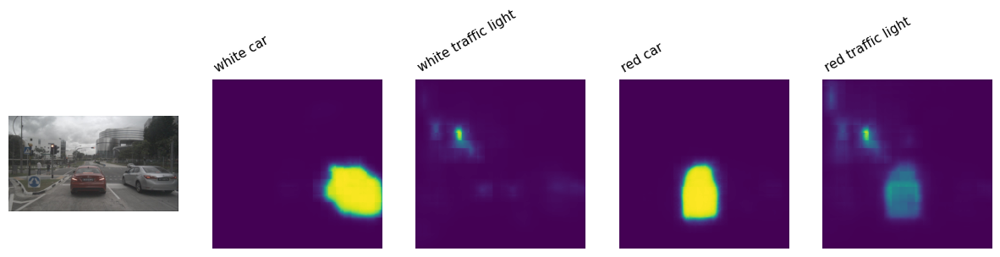

In [ ]:
from transformers import AutoProcessor, CLIPSegForImageSegmentation

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

detected_objects = list(set(detected_objects))
text_descriptions = detected_objects[:8]

# image = Image.open(rgb_path)
inputs = processor(text=text_descriptions, images=[image] * len(text_descriptions), padding=True, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
preds = logits.detach().unsqueeze(1)

_, ax = plt.subplots(1, len(text_descriptions) + 1, figsize=(3*(len(text_descriptions) + 1), 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(len(text_descriptions))];
[ax[i+1].text(0, -15, prompt, rotation=30) for i, prompt in enumerate(text_descriptions)];
# plt.imshow()
plt.show()

## Sampling Points from CLIPSeg to Prompt SAM

Threshold probabilities to sample points before filtering for medoids biases the selected points toward the peak of the distribution.

In [ ]:
def find_medoid_and_closest_points(points, num_closest=5):
    """
    Find the medoid from a collection of points and the closest points to the medoid.

    Parameters:
    points (np.array): A numpy array of shape (N, D) where N is the number of points and D is the dimensionality.
    num_closest (int): Number of closest points to return.

    Returns:
    np.array: The medoid point.
    np.array: The closest points to the medoid.
    """
    distances = np.sqrt(((points[:, np.newaxis, :] - points[np.newaxis, :, :]) ** 2).sum(axis=-1))
    distance_sums = distances.sum(axis=1)
    medoid_idx = np.argmin(distance_sums)
    medoid = points[medoid_idx]
    sorted_indices = np.argsort(distances[medoid_idx])
    closest_indices = sorted_indices[1:num_closest + 1]
    return medoid, points[closest_indices]

def sample_points_from_heatmap(heatmap, original_size, num_points=5, percentile=0.95):
    """
    Sample points from the given heatmap, focusing on areas with higher values.
    """
    threshold = np.percentile(heatmap.numpy(), percentile)
    masked_heatmap = torch.where(heatmap > threshold, heatmap, torch.tensor(0.0))
    probabilities = torch.softmax(masked_heatmap.flatten(), dim=0)

    attn = torch.sigmoid(heatmap)
    w = attn.shape[0]
    sampled_indices = torch.multinomial(torch.tensor(probabilities.ravel()), num_points, replacement=True)

    sampled_coords = np.array(np.unravel_index(sampled_indices, attn.shape)).T
    medoid, sampled_coords = find_medoid_and_closest_points(sampled_coords)
    pts = []
    for pt in sampled_coords.tolist():
        x, y = pt
        x = height * x / w
        y = width * y / w
        pts.append([y, x])
    return pts

sampled_points = []
original_size = img.shape[:2][::-1]
for idx in range(preds.shape[0]):
    sampled_points.append(sample_points_from_heatmap(preds[idx][0], original_size, num_points=10))

from transformers import SamModel, SamProcessor

sam_model = SamModel.from_pretrained("facebook/sam-vit-huge").to("cuda" if torch.cuda.is_available() else "cpu")
sam_processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

sam_masks = []
for idx in range(preds.shape[0]):
  sam_inputs = sam_processor(image, input_points=[sampled_points[idx]], return_tensors="pt").to(device)

  with torch.no_grad():
      sam_outputs = sam_model(**sam_inputs)

  sam_masks.append(sam_processor.image_processor.post_process_masks(
      sam_outputs.pred_masks.cpu(), sam_inputs["original_sizes"].cpu(), sam_inputs["reshaped_input_sizes"].cpu()
  ))

::ffff:127.0.0.1 - - [15/Apr/2024 14:17:02] "GET /point_clouds/libs/plasio/js/laslaz.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/sidebar.html HTTP/1.1" 200 -


config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/pointclouds/95e556/cloud.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/resources/textures/navigation/F.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/resources/icons/close.svg HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/resources/textures/navigation/D.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/resources/textures/navigation/B.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:03] "GET /point_clouds/libs/potree/resources/icons/eye_2.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:04] "GET /point_clouds/libs/potree/resources/textures/navigation/L.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:04] "GET /point_clouds/libs/potree/resources/textures/navigation/R.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15

model.safetensors:   0%|          | 0.00/2.56G [00:00<?, ?B/s]

::ffff:127.0.0.1 - - [15/Apr/2024 14:17:04] "GET /point_clouds/libs/potree/resources/lang/en/translation.json HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/lang/de/translation.json HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/icons/menu_button.svg HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/icons/map_icon.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/icons/point.svg HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/lang/dev/translation.json HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/icons/angle.png HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:17:05] "GET /point_clouds/libs/potree/resources/icons/clip-screen.svg HTTP/1.1" 200 -
::ffff:127.0.0.1 - - 

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

## Visualizing the Selected Points to Prompt SAM

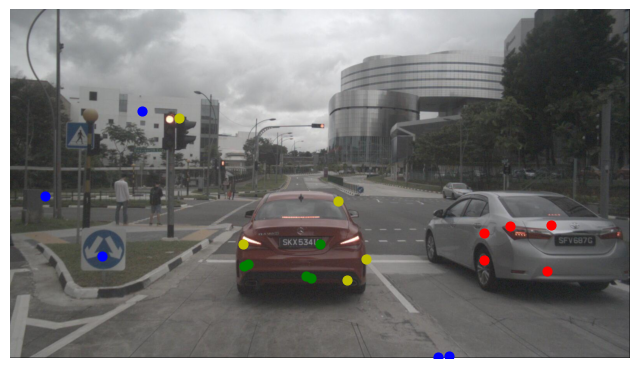

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')

colors = ['r', 'b', 'g', 'y', 'c', 'm', 'k', 'w']
for j in range(len(sampled_points)):
  for x, y in sampled_points[j]:
      plt.scatter(x, y, color=colors[j], s=40)

plt.show()

## Visualizing the SAM Segmentation Masks for Each Concept

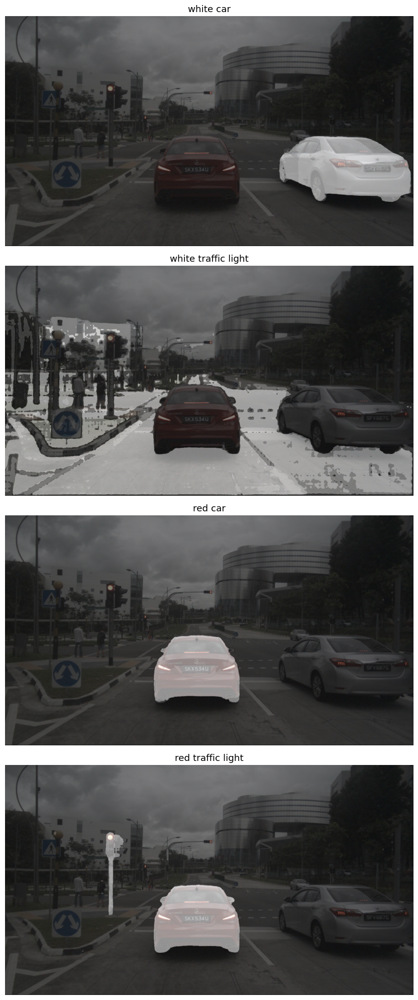

In [ ]:
num_masks = len(sam_masks)

plt.figure(figsize=(15, num_masks * 5))

for i, mask in enumerate(sam_masks):
    plt.subplot(num_masks, 1, i + 1)
    plt.imshow(image)
    plt.imshow(cv2.cvtColor(255 * mask[0].numpy().squeeze().transpose((1, 2, 0)).astype(np.uint8), cv2.COLOR_BGR2GRAY), cmap='gray', alpha=0.5)
    plt.title(f'{text_descriptions[i]}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:

def apply_mask_to_image(image, mask):
    """
    Apply a binary mask to an image. The mask should be a binary array where the regions to keep are True.
    """
    masked_image = image.copy()
    for c in range(masked_image.shape[2]):
        masked_image[:, :, c] = masked_image[:, :, c] * mask
    return masked_image

depth = cv2.cvtColor(cv2.imread(depth_path, cv2.IMREAD_UNCHANGED), cv2.COLOR_GRAY2BGR)
point_clouds = []
for i, mask_tensor in enumerate(sam_masks):
    mask = cv2.cvtColor(255 * mask_tensor[0].numpy().squeeze().transpose((1, 2, 0)).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    mask_binary = mask > 0

    masked_rgb = apply_mask_to_image(img, mask_binary)
    masked_depth = apply_mask_to_image(depth, mask_binary)

    masked_rgb_path = f'temp_masked_rgb_{i}.png'
    masked_depth_path = f'temp_masked_depth_{i}.png'
    cv2.imwrite(masked_rgb_path, masked_rgb)
    cv2.imwrite(masked_depth_path, masked_depth)

    pcd = create_point_cloud_from_rgbd(masked_rgb_path, masked_depth_path, intrinsic_parameters)
    point_clouds.append(pcd)

    os.remove(masked_rgb_path)
    os.remove(masked_depth_path)

for idx, pcd in enumerate(point_clouds):
    cl, ind = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
    inlier_cloud = pcd.select_by_index(ind)
    point_clouds[idx] = inlier_cloud

## Visualize the Segmented Point Cloud

In [ ]:
combined_pcd = o3d.geometry.PointCloud()
plane_model, inliers = pcd.segment_plane(distance_threshold=0.01, ransac_n=3, num_iterations=1000)
inlier_cloud = pcd.select_by_index(inliers)
combined_pcd += inlier_cloud

for pcd in point_clouds:
    combined_pcd += pcd

pcd_components, canonicalized, transformation = canonicalize_point_cloud(combined_pcd)

cloud = np.asarray(pcd_components.points)
cloudpath = pypotree.generate_cloud_for_display(cloud)
pypotree.display_cloud_colab(cloudpath)

/usr/local/lib/python3.10/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p b397d2 --material ELEVATION --edl-enabled --overwrite
https://localhost:43983/point_clouds/pointclouds/b397d2


## Compute Height with Axis-Aligned Bounding Boxes

In [ ]:
def get_bounding_box_height(pcd):
    """
    Compute the height of the bounding box for a given point cloud.

    Parameters:
    pcd (open3d.geometry.PointCloud): The input point cloud.

    Returns:
    float: The height of the bounding box.
    """
    aabb = pcd.get_axis_aligned_bounding_box()
    return aabb.get_extent()[1]  # Assuming the Y-axis is the up-direction

def compare_bounding_box_height(pcd_i, pcd_j):
    """
    Compare the bounding box heights of two point clouds.

    Parameters:
    pcd_i (open3d.geometry.PointCloud): The first point cloud.
    pcd_j (open3d.geometry.PointCloud): The second point cloud.

    Returns:
    bool: True if the bounding box of pcd_i is taller than that of pcd_j, False otherwise.
    """
    height_i = get_bounding_box_height(pcd_i)
    height_j = get_bounding_box_height(pcd_j)

    return height_i > height_j

# Example usage:
# Assuming 'point_clouds' is your list of Open3D point cloud objects
# And you want to compare the box of point cloud at index i with the box of point cloud at index j
i = 0
j = 1
is_taller = compare_bounding_box_height(point_clouds[i], point_clouds[j])

print(f"Bounding box of '{text_descriptions[i]}' is {'taller' if is_taller else 'not taller'} than bounding box of '{text_descriptions[j]}'.")


Bounding box of 'white car' is not taller than bounding box of 'white traffic light'.


In [ ]:
import random
import numpy as np
from itertools import combinations
from prompt_templates import *

from pointcloud import human_like_distance, calculate_distances_between_point_clouds


# Predicate prompts

def left_predicate(A, B):
    template_questions = left_predicate_questions
    true_responses = left_true_responses
    false_responses = left_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    is_left = A_pos[0] < B_pos[0]  # Compare X coordinates

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_left else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def right_predicate(A, B):
    template_questions = right_predicate_questions
    true_responses = right_true_responses
    false_responses = right_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    is_right = A_pos[0] > B_pos[0]  # Compare X coordinates

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_right else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def above_predicate(A, B):
    template_questions = above_predicate_questions
    true_responses = above_true_responses
    false_responses = above_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    is_above = A_pos[1] > B_pos[1]

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_above else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def below_predicate(A, B):
    template_questions = below_predicate_questions
    true_responses = below_true_responses
    false_responses = below_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    is_below = A_pos[1] < B_pos[1]

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_below else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def wide_predicate(A, B):
    template_questions = wide_predicate_questions
    true_responses = wide_true_responses
    false_responses = wide_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    width_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[0]
    width_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[0]

    is_wider = width_A > width_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_wider else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def big_predicate(A, B):
    template_questions = big_predicate_questions
    true_responses = big_true_responses
    false_responses = big_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    extent_A = A_cloud.get_axis_aligned_bounding_box().get_extent()
    volume_A = extent_A[0] * extent_A[1] * extent_A[2]

    extent_B = B_cloud.get_axis_aligned_bounding_box().get_extent()
    volume_B = extent_B[0] * extent_B[1] * extent_B[2]

    is_bigger = volume_A > volume_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_bigger else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer

def tall_predicate(A, B):
    template_questions = tall_predicate_questions
    true_responses = tall_true_responses
    false_responses = tall_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    height_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[1]
    height_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[1]

    is_taller = height_A > height_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_taller else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def short_predicate(A, B):
    template_questions = short_predicate_questions
    true_responses = short_true_responses
    false_responses = short_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    height_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[1]
    height_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[1]

    is_shorter = height_A < height_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_shorter else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def thin_predicate(A, B):
    template_questions = thin_predicate_questions
    true_responses = thin_true_responses
    false_responses = thin_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    width_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[0]
    width_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[0]

    is_thinner = width_A < width_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_thinner else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def small_predicate(A, B):
    template_questions = small_predicate_questions
    true_responses = small_true_responses
    false_responses = small_false_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    extent_A = A_cloud.get_axis_aligned_bounding_box().get_extent()
    volume_A = extent_A[0] * extent_A[1] * extent_A[2]

    extent_B = B_cloud.get_axis_aligned_bounding_box().get_extent()
    volume_B = extent_B[0] * extent_B[1] * extent_B[2]

    is_smaller = volume_A < volume_B

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_smaller else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def behind_predicate(A, B):
    template_questions = behind_predicate_questions
    true_responses = behind_true
    false_responses = behind_false

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_center = A_cloud.get_axis_aligned_bounding_box().get_center()
    B_center = B_cloud.get_axis_aligned_bounding_box().get_center()
    is_behind = A_center[2] > B_center[2]

    question_template = random.choice(template_questions)
    response_template = random.choice(true_responses if is_behind else false_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


def front_predicate(A, B):
    template_questions = front_predicate_questions
    true_responses = front_true
    false_responses = front_false

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_center = A_cloud.get_axis_aligned_bounding_box().get_center()
    B_center = B_cloud.get_axis_aligned_bounding_box().get_center()
    is_in_front = A_center[2] < B_center[2]

    question_template = random.choice(template_questions)
    response_template = random.choice(
        true_responses if is_in_front else false_responses
    )

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = response_template.replace("[A]", A_desc).replace("[B]", B_desc)

    return question + " Answer: " + answer


# Choice prompts

def left_choice(A, B):
    template_questions = left_choice_questions
    template_responses = left_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    more_left = A_desc if A_pos[0] < B_pos[0] else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", more_left)

    return question + " Answer: " + answer


def right_choice(A, B):
    template_questions = right_choice_questions
    template_responses = right_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    more_right = A_desc if A_pos[0] > B_pos[0] else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", more_right)

    return question + " Answer: " + answer


def above_choice(A, B):
    template_questions = above_choice_questions
    template_responses = above_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    more_above = A_desc if A_pos[1] > B_pos[1] else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", more_above)

    return question + " Answer: " + answer


def below_choice(A, B):
    template_questions = below_choice_questions
    template_responses = below_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    A_pos = A_cloud.get_center()
    B_pos = B_cloud.get_center()

    more_below = A_desc if A_pos[1] < B_pos[1] else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", more_below)

    return question + " Answer: " + answer


def tall_choice(A, B):
    template_questions = tall_choice_questions
    template_responses = tall_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    height_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[1]
    height_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[1]

    taller = A_desc if height_A > height_B else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", taller)

    return question + " Answer: " + answer


def short_choice(A, B):
    template_questions = short_choice_questions
    template_responses = short_choice_responses

    A_desc, A_cloud = A
    B_desc, B_cloud = B
    A_desc, B_desc = A_desc.lower(), B_desc.lower()

    height_A = A_cloud.get_axis_aligned_bounding_box().get_extent()[1]
    height_B = B_cloud.get_axis_aligned_bounding_box().get_extent()[1]

    shorter = A_desc if height_A < height_B else B_desc

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_responses)

    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = answer_template.replace("[X]", shorter)

    return question + " Answer: " + answer


# Distance prompts

def generate_spatial_reasoning_data(
    A, B, human_readable_dist, template_questions, template_answers
):
    A_desc, B_desc = A[0].lower(), B[0].lower()

    question_template = random.choice(template_questions)
    answer_template = random.choice(template_answers)

    # Replace placeholders with actual values
    question = question_template.replace("[A]", A_desc).replace("[B]", B_desc)
    answer = (
        answer_template.replace("[A]", A_desc)
        .replace("[B]", B_desc)
        .replace("[X]", human_readable_dist)
    )

    # Add to the dataset
    return question + " Answer: " + answer


def vertical_distance_data(A, B):
    template_questions = vertical_distance_questions
    template_answers = vertical_distance_answers

    A_center = A[1].get_axis_aligned_bounding_box().get_center()
    B_center = B[1].get_axis_aligned_bounding_box().get_center()
    vertical_distance = abs(A_center[1] - B_center[1])
    human_readable_dist = human_like_distance(vertical_distance)

    return generate_spatial_reasoning_data(
        A, B, human_readable_dist, template_questions, template_answers
    )


def horizontal_distance_data(A, B):
    template_questions = horizontal_distance_questions
    template_answers = horizontal_distance_answers

    A_center = A[1].get_axis_aligned_bounding_box().get_center()
    B_center = B[1].get_axis_aligned_bounding_box().get_center()
    horizontal_distance = np.sqrt(
        (A_center[0] - B_center[0]) ** 2 + (A_center[2] - B_center[2]) ** 2
    )

    human_readable_dist = human_like_distance(horizontal_distance)
    # return generate_spatial_reasoning_data(
    #     A, B, human_readable_dist, template_questions, template_answers
    # )
    return human_readable_dist


def width_data(A, B=None):
    A_desc = A[0].lower()

    template_questions = width_questions
    template_answers = width_answers

    width = A[1].get_axis_aligned_bounding_box().get_extent()[0]

    human_readable_width = human_like_distance(width)
    question_template = random.choice(template_questions)
    answer_template = random.choice(template_answers)

    question = question_template.replace("[A]", A_desc)
    answer = answer_template.replace("[A]", A_desc).replace("[X]", human_readable_width)

    # return question + " Answer: " + answer
    return human_readable_width

def height_data(A, B=None):
    A_desc = A[0].lower()

    template_questions = height_questions
    template_answers = height_answers

    width = A[1].get_axis_aligned_bounding_box().get_extent()[0]

    human_readable_width = human_like_distance(width)
    question_template = random.choice(template_questions)
    answer_template = random.choice(template_answers)

    question = question_template.replace("[A]", A_desc)
    answer = answer_template.replace("[A]", A_desc).replace("[X]", human_readable_width)

    return question + " Answer: " + answer


def evaluate_predicates_on_pairs(pairs, is_canonicalized):
    all_prompt_variants = [
        left_predicate,
        right_predicate,
        wide_predicate,
        big_predicate,
        thin_predicate,
        small_predicate,
        behind_predicate,
        front_predicate,
        left_choice,
        right_choice,
    ]

    add_canonicalized = [
            tall_choice,
            above_predicate,
            below_predicate,
            short_choice,
            below_choice,
            tall_predicate,
            short_predicate,
            above_choice,
            vertical_distance_data,
            horizontal_distance_data,
            width_data,
            height_data,
        ]

    if is_canonicalized:
        all_prompt_variants += add_canonicalized

    selected_predicates_choices = random.sample(all_prompt_variants, 10)

    results = []

    for A, B in pairs:
        pair_results = []
        for prompt_func in selected_predicates_choices:
            pair_results.append(prompt_func(A, B))

        # Run each of the distance functions
        distance = calculate_distances_between_point_clouds(A[1], B[1])
        pair_results.append(
            generate_spatial_reasoning_data(
                A,
                B,
                distance,
                distance_template_questions,
                distance_template_answers,
            )
        )

        results.extend(pair_results)
    return results

iterate over multiple images

In [ ]:
import os
import random
import re


directory_path = '/content/drive/MyDrive/CAM_FRONT'
output_directory = '/content/drive/MyDrive/questions'

os.makedirs(output_directory, exist_ok=True)

for filename in os.listdir(directory_path):
  try:
    if filename.endswith(".png") or filename.endswith(".jpg"):  # Add other file types if needed
        # Construct full file path
        file_path = os.path.join(directory_path, filename)

        base_filename = os.path.splitext(filename)[0]

        output_path = os.path.join(output_directory, f'{base_filename}.txt')


        # Open and display the image
        with Image.open(file_path) as image:
            depth = zoe.infer_pil(image, output_type='pil')
            # You can perform other image processing here
            depth.save('Cars_depth.png')

            depth_path = "Cars_depth.png"

            rgb_path = file_path
            img = cv2.imread(rgb_path)
            height, width, _ = img.shape

            model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

            # Load an image with PIL
            # image = Image.open('Cars.jpg')

            # Inference
            results = model(image)

            # Results
            # results.print()

            for *xyxy, conf, cls in results.xyxy[0]:
              # Extract bounding box coordinates
              x1, y1, x2, y2 = map(int, xyxy)
              color = get_dominant_color(img, (x1, y1, x2-x1, y2-y1))
              # print(f'Dominant color: {color}')

            detected_objects = []

            # Loop through the detections, get the color description, and print it along with the object class
            for *xyxy, conf, cls in results.xyxy[0]:
                # Extract bounding box coordinates
                x1, y1, x2, y2 = map(int, xyxy)
                # Get the color
                rgb_color = get_dominant_color(img, (x1, y1, x2-x1, y2-y1))
                #print(f'RGB Color: {rgb_color}')
                color_desc = color_name(rgb_color)
                hsv_color = cv2.cvtColor(np.uint8([[rgb_color]]), cv2.COLOR_RGB2HSV)[0][0]
                #print(f'HSV Color: {hsv_color}')
                color_desc = color_name(hsv_color)
                class_name = results.names[int(cls)]
                if class_name != 'person':
                  object_description = f'{color_desc} {class_name}'
                  # print(object_description)

                  detected_objects.append(object_description)
            # print(detected_objects)



            intrinsic_parameters = {
                'width': width,
                'height': height,
                'fx': 1.5 * width,
                'fy': 1.5 * width,
                'cx': width / 2,
                'cy': height / 2,
            }


            device = "cuda" if torch.cuda.is_available() else "cpu"

            processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
            model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

            text_descriptions = detected_objects[:8]

            # image = Image.open(rgb_path)
            inputs = processor(text=text_descriptions, images=[image] * len(text_descriptions), padding=True, return_tensors="pt")
            outputs = model(**inputs)
            logits = outputs.logits
            preds = logits.detach().unsqueeze(1)


            sampled_points = []
            original_size = img.shape[:2][::-1]
            for idx in range(preds.shape[0]):
                sampled_points.append(sample_points_from_heatmap(preds[idx][0], original_size, num_points=10))




            sam_masks = []
            for idx in range(preds.shape[0]):
              sam_inputs = sam_processor(image, input_points=[sampled_points[idx]], return_tensors="pt").to(device)

              with torch.no_grad():
                  sam_outputs = sam_model(**sam_inputs)

              sam_masks.append(sam_processor.image_processor.post_process_masks(
                  sam_outputs.pred_masks.cpu(), sam_inputs["original_sizes"].cpu(), sam_inputs["reshaped_input_sizes"].cpu()
              ))

            num_masks = len(sam_masks)

            depth = cv2.cvtColor(cv2.imread(depth_path, cv2.IMREAD_UNCHANGED), cv2.COLOR_GRAY2BGR)
            point_clouds = []
            for i, mask_tensor in enumerate(sam_masks):
                mask = cv2.cvtColor(255 * mask_tensor[0].numpy().squeeze().transpose((1, 2, 0)).astype(np.uint8), cv2.COLOR_BGR2GRAY)
                mask_binary = mask > 0

                masked_rgb = apply_mask_to_image(img, mask_binary)
                masked_depth = apply_mask_to_image(depth, mask_binary)

                masked_rgb_path = f'temp_masked_rgb_{i}.png'
                masked_depth_path = f'temp_masked_depth_{i}.png'
                cv2.imwrite(masked_rgb_path, masked_rgb)
                cv2.imwrite(masked_depth_path, masked_depth)

                pcd = create_point_cloud_from_rgbd(masked_rgb_path, masked_depth_path, intrinsic_parameters)
                point_clouds.append(pcd)

                os.remove(masked_rgb_path)
                os.remove(masked_depth_path)

            for idx, pcd in enumerate(point_clouds):
                cl, ind = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
                inlier_cloud = pcd.select_by_index(ind)
                point_clouds[idx] = inlier_cloud


            text_array = []







            index_a, index_b = random.sample(range(len(text_descriptions)), 2)

            description_A = text_descriptions[index_a]
            description_B = text_descriptions[index_b]

            pair_A = (description_A, point_clouds[index_a])
            pair_B = (description_B, point_clouds[index_b])

            # Perform the comparison using your predicate functions
            left_result = left_predicate(pair_A, pair_B)
            right_result = right_predicate(pair_A, pair_B)

            left_indices = random.sample(range(len(left_predicate_questions)), 2)

            right_indices = random.sample(range(len(right_predicate_questions)), 2)

            left_qa_pairs = []
            for index in left_indices:
                question = left_predicate_questions[index].replace('[A]', description_A).replace('[B]', description_B)
                answer = (left_true_responses if left_result else left_false_responses)[index].replace('[A]', description_A).replace('[B]', description_B)
                left_qa_pairs.append((question, answer))

            index_a, index_b = random.sample(range(len(text_descriptions)), 2)

            # For right
            right_qa_pairs = []
            for index in right_indices:
                question = right_predicate_questions[index].replace('[A]', description_A).replace('[B]', description_B)
                answer = (right_true_responses if right_result else right_false_responses)[index].replace('[A]', description_A).replace('[B]', description_B)
                right_qa_pairs.append((question, answer))

            # for question, answer in left_qa_pairs:
            #     print("Left Question:", question)
            #     print("Left Answer:", answer)

            # for question, answer in right_qa_pairs:
            #     print("Right Question:", question)
            #     print("Right Answer:", answer)

            index_a, index_b = random.sample(range(len(text_descriptions)), 2)

            description_A = text_descriptions[index_a]
            description_B = text_descriptions[index_b]

            pair_A = (description_A, point_clouds[index_a])
            pair_B = (description_B, point_clouds[index_b])

            distance_results = calculate_distances_between_point_clouds(pair_A[1], pair_B[1])


            # Extract the numeric part of the string
            distance_numeric = float(re.findall("\d+\.\d+|\d+", distance_results)[0])

            # Now pass the numeric value to the human_like_distance function
            human_readable_dist = human_like_distance(distance_numeric)

            human_readable_dist = horizontal_distance_data(
              pair_A, pair_B
            )

            dist_indices = random.sample(range(len(distance_template_questions[:7])), 2)


            dist_qa_pairs = []
            distance_template_questions = distance_template_questions[:7]
            for index in dist_indices:
                question = distance_template_questions[index].replace('[A]', description_A).replace('[B]', description_B)
                answer = distance_template_answers[index].replace('[A]', description_A).replace('[B]', description_B).replace('[X]', str(human_readable_dist))
                dist_qa_pairs.append((question, answer))

            # for question, answer in dist_qa_pairs:
            #     print("Distance Question:", question)
            #     print("Distance Answer:", answer)


            index_a = random.sample(range(len(text_descriptions)), 2)

            description_A = text_descriptions[index_a[0]]



            pair_A = (description_A, point_clouds[index_a[0]])

            width_result = width_data(pair_A)


            width_numeric = float(re.findall("\d+\.\d+|\d+", width_result)[0])


            # Now pass the numeric value to the human_like_distance function
            human_readable_dist = width_result

            width_indices = random.sample(range(len(width_questions[:5])), 2)

            width_qa_pairs = []
            width_questions = width_questions[:5]
            for index in width_indices:
              question = width_questions[index].replace('[A]', description_A)
              answer = width_answers[index].replace('[A]', description_A).replace('[X]', str(human_readable_dist))
              width_qa_pairs.append((question, answer))

            # for question, answer in width_qa_pairs:
                # print("width Question:", question)
                # print("width Answer:", answer)


            text_array = text_array + left_qa_pairs + dist_qa_pairs + width_qa_pairs + right_qa_pairs


            with open(output_path, 'w', encoding='utf-8') as file:
              for question, answer in text_array:
                file.write(f'Question: {question} Answer: {answer}\n')




    else:
        continue  # Skip non-image files
  except:
    print("failed an image")

::ffff:127.0.0.1 - - [15/Apr/2024 14:18:55] "GET /point_clouds/pointclouds/b397d2/data/r/r1.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:18:55] "GET /point_clouds/pointclouds/b397d2/data/r/r0.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:19:04] "GET /point_clouds/pointclouds/b397d2/data/r/r15.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:19:05] "GET /point_clouds/pointclouds/b397d2/data/r/r11.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:19:05] "GET /point_clouds/pointclouds/b397d2/data/r/r10.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [15/Apr/2024 14:19:05] "GET /point_clouds/pointclouds/b397d2/data/r/r14.bin HTTP/1.1" 200 -
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 pa

failed an image


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-4-15 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
text_array

In [ ]:
right_qa_pairs
left_qa_pairs

In [ ]:
width_qa_pairs

In [ ]:
i = 0
j = 1
is_taller = compare_bounding_box_height(point_clouds[i], point_clouds[j])

print(f"Bounding box of '{text_descriptions[i]}' is {'taller' if is_taller else 'not taller'} than bounding box of '{text_descriptions[j]}'.")


In [ ]:
detected_objects